# Housing Price Prediction:-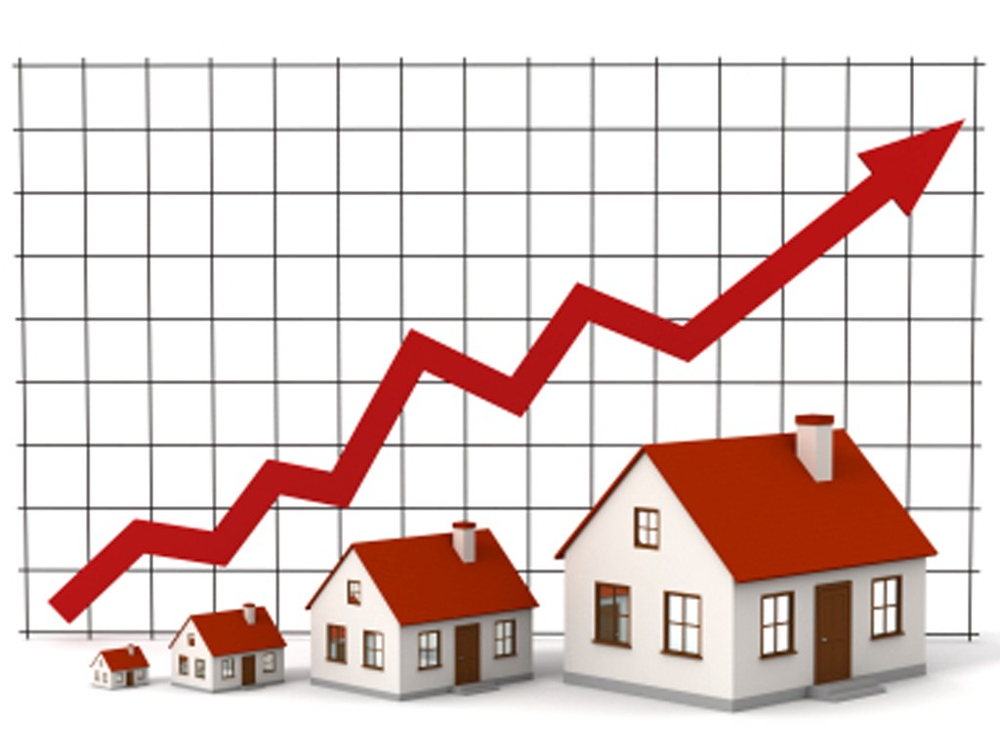

# Problem Statement:-

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate 
market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market 
and there are various companies working in the domain. Data science comes as a very important tool to solve problems 
in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and 
focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, 
recommendation systems are some of the machine learning techniques used for achieving the business goals for housing 
companies. Our problem is related to one such housing company.

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses 
data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same 
purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file 
below.

The company is looking at prospective properties to buy houses to enter the market. You are required to build a model 
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest 
in them or not. For this company wants to know:

• Which variables are important to predict the price of variable?

• How do these variables describe the price of the house?

# Business Goal:
You are required to model the price of houses with the available independent variables. This model will then be used 
by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the 
strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the 
management to understand the pricing dynamics of a new market.

# Importing Necessary Libraries for Model Building:-

In [1]:
import numpy as np

import pandas as pd

import sklearn

import matplotlib.pyplot as plt

from numpy import mean

%matplotlib inline


from matplotlib import style

import matplotlib.gridspec as gridspec

from matplotlib.gridspec import GridSpec

from scipy.stats import norm

import seaborn as sns

from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import train_test_split

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

from sklearn.naive_bayes import GaussianNB

from sklearn.preprocessing import LabelEncoder

import warnings

warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Taking the Dataset for which model buliding is required:-

In [2]:
df1 = pd.read_csv('train.csv')
df1

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,BrkFace,31.0,TA,Gd,CBlock,TA,TA,No,BLQ,450,Unf,0,432,882,GasA,TA,Y,SBrkr,900,0,0,900,0,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1970.0,Unf,1,280,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Feedr,Norm,1Fam,1Story,4,5,1949,2003,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,1126,0,0,1126,0,0,2,0,2,1,Gd,5,Typ,0,NaN,Detchd,2002.0,Fin,2,520,TA,TA,N,0,96,0,0,0,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,NPkVill,Norm,Norm,Twnhs,2Story,6,6,1976,1976,Gable,CompShg,Plywood,Brk Cmn,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,566,Unf,0,289,855,GasA,TA,Y,SBrkr,855,601,0,1456,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1976.0,Unf,2,440,TA,TA,Y,87,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Feedr,Norm,1Fam,2Story,4,4,1920,1950,Gambrel,CompShg,BrkFace,BrkFace,None,0.0,TA,Fa,BrkTil,TA,TA,No,Unf,0,Unf,0,649,649,Ga

In [3]:
#Checking the First five entries of dataset:-

df1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [4]:
#Checking Last five entries of Dataset:-

df1.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,BrkFace,31.0,TA,Gd,CBlock,TA,TA,No,BLQ,450,Unf,0,432,882,GasA,TA,Y,SBrkr,900,0,0,900,0,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1970.0,Unf,1,280,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Feedr,Norm,1Fam,1Story,4,5,1949,2003,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,1126,0,0,1126,0,0,2,0,2,1,Gd,5,Typ,0,NaN,Detchd,2002.0,Fin,2,520,TA,TA,N,0,96,0,0,0,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,NPkVill,Norm,Norm,Twnhs,2Story,6,6,1976,1976,Gable,CompShg,Plywood,Brk Cmn,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,566,Unf,0,289,855,GasA,TA,Y,SBrkr,855,601,0,1456,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1976.0,Unf,2,440,TA,TA,Y,87,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Feedr,Norm,1Fam,2Story,4,4,1920,1950,Gambrel,CompShg,BrkFace,BrkFace,None,0.0,TA,Fa,BrkTil,TA,TA,No,Unf,0,Unf,0,649,649,GasA,TA,N,SBrkr,649,668,0,1317,0,0,1,0,3,1,TA,6,Typ,0,NaN,Detchd,1920.0,Unf,1,250,TA,Fa,N,0,54,172,0,0,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000
1167,617,60,RL,NaN,7861,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2002,2003,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,457,Unf,0,326,783,GasA,Ex,Y,SBrkr,807,702,0,1509,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2002.0,Fin,2,393,TA,TA,Y,100,75,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,183200


In [5]:
#Checking the Dataset Shape

df1.shape

(1168, 81)

Remarks: In the above cells, we can see that there are 1168 rows and 81 columns present in the training dataset. There are numerical data columns as well as object type data columns that we will convert to numerical format before training our model. Since we are supposed to predict the target/label "SalePrice" which is a numerical data type column, so it makes this a Regression problem.

# EXPLORATORY DATA ANALYSIS (EDA)

# Non-Graphical EDA:

In [6]:
#To see all the columns and rows in a dataframe

pd.set_option('display.max_columns', None)

pd.set_option('display.max_rows', None)


In [7]:
df1.head(9)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000


In [8]:
df1.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
  

In [9]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [10]:
#Finding Null values in Dataset

df1.isnull().sum()


Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [11]:
#Cheking Unique Values
df1.nunique()

Id               1168
MSSubClass         15
MSZoning            5
LotFrontage       106
LotArea           892
Street              2
Alley               2
LotShape            4
LandContour         4
Utilities           1
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         110
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        14
Exterior2nd        15
MasVnrType          4
MasVnrArea        283
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        551
BsmtFinType2        6
BsmtFinSF2        122
BsmtUnfSF         681
TotalBsmtSF       636
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          669
2ndFlrSF          351
LowQualFin

In [12]:
#Making lists to see object columns and numerical columns separately
numeric_data = []
for x in df1.dtypes.index:
    if df1.dtypes[x] == 'int64' or df1.dtypes[x] == 'float64':
        numeric_data.append(x)
print(f"\nNUMERIC DATA COLUMNS: ", numeric_data)


object_data = []
for x in df1.dtypes.index:
    if df1.dtypes[x] == 'O':
        object_data.append(x)        
print(f"OBJECT DATA COLUMNS: ", object_data)


NUMERIC DATA COLUMNS:  ['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']
OBJECT DATA COLUMNS:  ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'Fir

# Statistical Analysis:

In [13]:
df1.describe().T.style.background_gradient(cmap='flag')

,count,mean,std,min,25%,50%,75%,max
Id,1168.000000,724.136130,416.159877,1.000000,360.500000,714.500000,1079.500000,1460.000000
MSSubClass,1168.000000,56.767979,41.940650,20.000000,20.000000,50.000000,70.000000,190.000000
LotFrontage,954.000000,70.988470,24.828750,21.000000,60.000000,70.000000,80.000000,313.000000
LotArea,1168.000000,10484.749144,8957.442311,1300.000000,7621.500000,9522.500000,11515.500000,164660.000000
OverallQual,1168.000000,6.104452,1.390153,1.000000,5.000000,6.000000,7.000000,10.000000
OverallCond,1168.000000,5.595890,1.124343,1.000000,5.000000,5.000000,6.000000,9.000000
YearBuilt,1168.000000,1970.930651,30.145255,1875.000000,1954.000000,1972.000000,2000.000000,2010.000000
YearRemodAdd,1168.000000,1984.758562,20.785185,1950.000000,1966.000000,1993.000000,2004.000000,2010.000000
MasVnrArea,1161.000000,102.310078,182.595606,0.000000,0.000000,0.000000,160.000000,1600.000000
BsmtFinSF1,1168.000000,444.726027,462.664785,0.000000,0.000000,385.500000,714.500000,5644.000000


Remarks: In the above cell, we can see all the numeric value details and we can also see the spread of the data like the target "SalePrice" has min value of 34900 and max value of 755000. Count is not same for all the columns indicating that there are missing values present in the dataset.

# Univariate Analysis

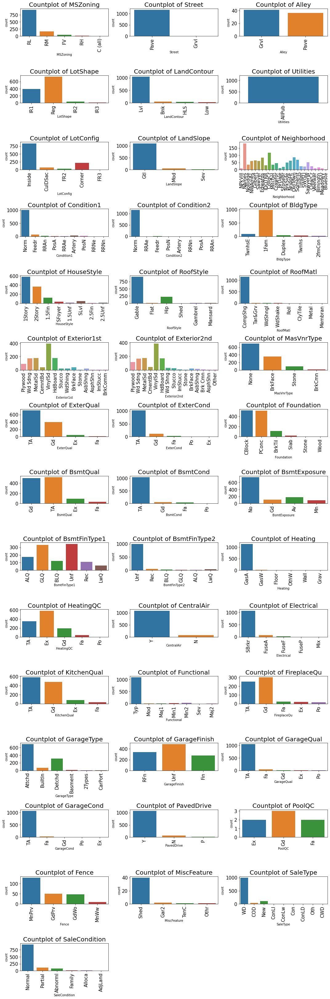

In [14]:
#checking countplots of all the object data type columns
col1=['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition']

plt.figure(figsize=(15,300))
for i in range(len(col1)):
    plt.subplot(100,3,i+1)
    sns.countplot(df1[col1[i]])
    plt.title(f"Countplot of {col1[i]}",fontsize=20)
    plt.xticks(rotation=90,fontsize=15)
    plt.yticks(fontsize=15)
    plt.tight_layout()

Observations:

1) From MSZoning plot, we can see that most of the people like houses in the zone having Residential Low Density

2) From Street plot, we can see that most of the people like to have property that have paved roads.

3) From Alley plot, we can see that mostly people like to have gravel alley.

4) From LotShape plot, we can see that mostly people like regular followed by slightly irregular shaped property.

5) From LandContour plot,we can see that mostly people preferred property having Flatness Near Flat/Level.

6) From LotConfig plot, we can see that mostly people like inside lot and around 20% of people like corner lot

7) From LandSlope plot, we can see that the majority of people preferred property having Gentle slope.

8) From Neighborhood plot, we can see that mostly people preferred North Ames followed by College Creek as the Physical    locations within Ames city limits.

9) From Condition1 & Condition2 plot, we can see that mostly people preferred normal Proximity to various conditions.

10) From BldgType plot, we see that people preferred single-family detached as the Type of dwelling.

11) From HouseStyle plot, we see that mostly people selected one story, and two story houses.

12) From RoofStyle plot, we can see that mostly people like Gable type of roof.

13) From RoofMatl plot, we see that mostly people preffered clay or tile roof material.

14) From Exterior1st and Exterior2nd plot, we see that moslty people preferred Vinyl Siding and Hard board as the exterior covering on houses.

15) From MasVnrType plot, we can say that people like None.

16) From ExterQual and ExterCond plot, it is see that mostly people are happy with Average quality material on the exterior of the houses.

17) From Foundation plot, we can say moslty people preferred Cinder Block and Poured Contrete type of foundation.

18) From BsmntQual and BsmtCond plot, we see that people like Good (90-99 inches) and Typical (80-89 inches) kind of basement.

19) From BsmtExposure plot, it can be see that people like No Exposure type of garden level walls.

20) From BsmtFinType1 plot, we can say moslty people like Good Living Quarters followed by unfinished type of basement finished area.

21) From BsmtFinType2 plot, we can say people like good living quarters with basement finished area.

22) From CenteralAir plot,we can say moslty people like to have central air.

23) From Electrical system plot, we can say people like Standard Circuit Breakers & Romex(SBrkr).

24) From Countplot of Garage type, we can say people love to have houses that have garage attached to home.

25) From Heating plot, we can see that people preferred Gas forced warm air furnace.

26) From HeatingQC plot, we can see that people preferred houses with excellent, followed by typical/average type of heating quality and condition.

27) From Functional plot, we can see that mostly people preferred houses with Typical Functionality.

28) From KitchenQual plot, we can see that mostly people preferred houses with Typical/Average type of kitchen quality followed by Good and excellent kitchen quality.

29) From FireplaceQual plot, we can see that majority of people preferred house with Average i.e., Prefabricated Fireplace in main living area or Masonry Fireplace in basement.

30) From GarageFinish plot, we can see that mostly people preferred houses having unfinished or roughly finished garage.

31) From GarageQual and GarageCond plot, it is see that people mostly like houses with Typical/Average quality and condition garage.

32) From PavedDrive plot, it is seen that people preferred houses with paved driveway.

33) From PoolQC plot, it is seen that people like houses with good qualityb pool.

34) From Fence plot, it is seen that mostly people like Minimum Privacy quality fence.

35) From MisFeature plot, we can see that people preferred houses with shed.

36) From Salestype plot, we can say people love to have a home that have Warranty Deed- Conventional type of sale.

37) From salesconditon plot, we can say people love to have a home that have normal sale.

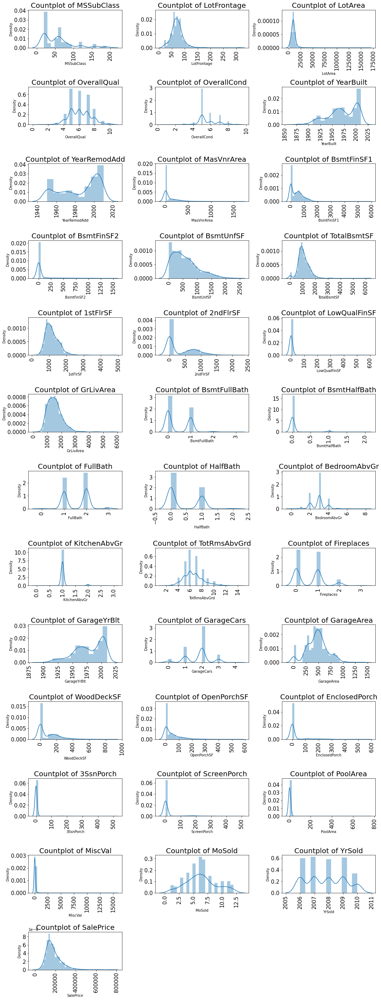

In [15]:
#Checking countplots of all the numeric data type columns

col2=['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice']

plt.figure(figsize=(15,300))
for i in range(len(col2)):
    plt.subplot(100,3,i+1)
    sns.distplot(df1[col2[i]])
    plt.title(f"Countplot of {col2[i]}",fontsize=20)
    plt.xticks(rotation=90,fontsize=15)
    plt.yticks(fontsize=15)
    plt.tight_layout()

Observations:

1) From LotFrontage countplot, we can say that majority of people preferred linear feet of street between 60-80.

2) From LotArea countplot, we can see that mostly people like lot size between 0-25000sq.ft.

3) From Total square feet of basement area(TotalBsmtSF) plot, we can say the value is mostly in between 100-2000 and majority of people have the basement of size 800-1100 square feet.

4) From GrLivArea plot, we can say mostly people have above grade living area square feet between 1200-1900.

5) From GarageArea plot, we can say mostly people like to have garage having area between 450-600 sq. ft.

6) From saleprice plot, we can say majority of people like to buy houses having price between 140000-190000 and also the data is right skewed.

In [16]:
#numeric dataframe
num_data=df1.select_dtypes(exclude='object')
num_data.head(10)

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,127,120,NaN,4928,6,5,1976,1976,0.0,120,0,958,1078,958,0,0,958,0,0,2,0,2,1,5,1,1977.0,2,440,0,205,0,0,0,0,0,2,2007,128000
1,889,20,95.0,15865,8,6,1970,1970,0.0,351,823,1043,2217,2217,0,0,2217,1,0,2,0,4,1,8,1,1970.0,2,621,81,207,0,0,224,0,0,10,2007,268000
2,793,60,92.0,9920,7,5,1996,1997,0.0,862,0,255,1117,1127,886,0,2013,1,0,2,1,3,1,8,1,1997.0,2,455,180,130,0,0,0,0,0,6,2007,269790
3,110,20,105.0,11751,6,6,1977,1977,480.0,705,0,1139,1844,1844,0,0,1844,0,0,2,0,3,1,7,1,1977.0,2,546,0,122,0,0,0,0,0,1,2010,190000
4,422,20,NaN,16635,6,7,1977,2000,126.0,1246,0,356,1602,1602,0,0,1602,0,1,2,0,3,1,8,1,1977.0,2,529,240,0,0,0,0,0,0,6,2009,215000
5,1197,60,58.0,14054,7,5,2006,2006,0.0,0,0,879,879,879,984,0,1863,0,0,2,1,4,1,9,1,2006.0,3,660,100,17,0,0,0,0,0,11,2006,219210
6,561,20,NaN,11341,5,6,1957,1996,180.0,1302,0,90,1392,1392,0,0,1392,1,0,1,1,3,1,5,1,1957.0,2,528,0,0,0,0,95,0,0,5,2010,121500
7,1041,20,88.0,13125,5,4,1957,2000,67.0,168,682,284,1134,1803,0,0,1803,1,0,2,0,3,1,8,1,1957.0,2,484,0,0,0,0,0,0,0,1,2006,155000
8,503,20,70.0,9170,5,7,1965,1965,0.0,698,96,420,1214,1214,0,0,1214,1,0,1,0,2,1,6,0,1965.0,2,461,0,0,184,0,0,0,400,4,2007,140000
9,576,50,80.0,8480,5,5,1947,1950,0.0,442,0,390,832,832,384,0,1216,0,0,1,0,2,1,6,0,1947.0,1,336,158,0,102,0,0,0,0,10,2008,118500


# Bivariate Analysis

Text(0, 0.5, 'Average SalesPrice')

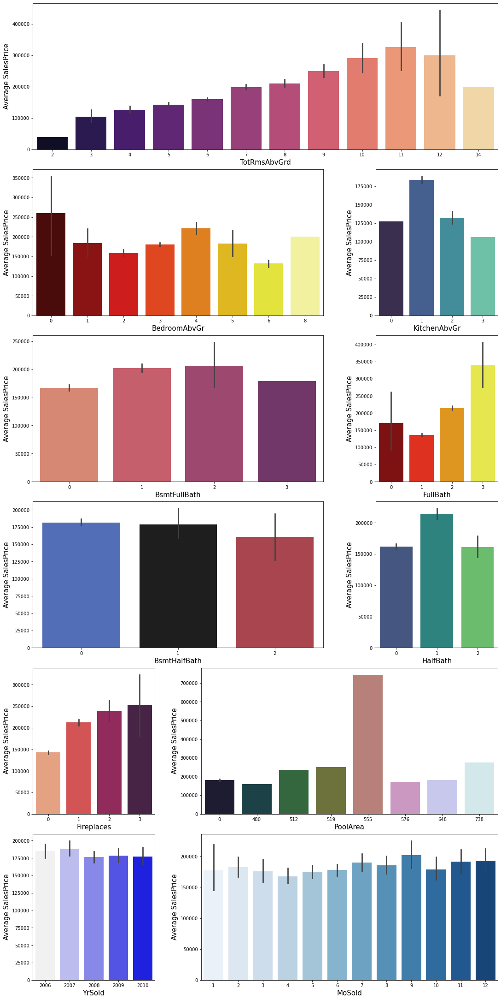

In [17]:
# Checking realtion of SalePrice with object features using barplot
FIG=plt.figure(constrained_layout=True,figsize=(15,30))
GS=GridSpec(6,3,figure=FIG)

plt.subplot(GS[0,:])
a1=sns.barplot(data=df1,x="TotRmsAbvGrd",y="SalePrice",estimator=mean,palette='magma')
plt.xlabel("TotRmsAbvGrd",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

plt.subplot(GS[1,:-1])
a1=sns.barplot(data=df1,x="BedroomAbvGr",y="SalePrice",estimator=mean,palette='hot')
plt.xlabel("BedroomAbvGr",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

plt.subplot(GS[1,-1])
a1=sns.barplot(data=df1,x="KitchenAbvGr",y="SalePrice",estimator=mean,palette='mako')
plt.xlabel("KitchenAbvGr",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

plt.subplot(GS[2,:-1])
a1=sns.barplot(data=df1,x="BsmtFullBath",y="SalePrice",estimator=mean,palette='flare')
plt.xlabel("BsmtFullBath",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

plt.subplot(GS[2,-1])
a1=sns.barplot(data=df1,x="FullBath",y="SalePrice",estimator=mean,palette='hot')
plt.xlabel("FullBath",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

plt.subplot(GS[3,:-1])
a1=sns.barplot(data=df1,x="BsmtHalfBath",y="SalePrice",estimator=mean,palette='icefire')
plt.xlabel("BsmtHalfBath",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

plt.subplot(GS[3,-1])
a1=sns.barplot(data=df1,x="HalfBath",y="SalePrice",estimator=mean,palette='viridis')
plt.xlabel("HalfBath",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

plt.subplot(GS[4,:-2])
a1=sns.barplot(data=df1,x="Fireplaces",y="SalePrice",estimator=mean,palette='rocket_r')
plt.xlabel("Fireplaces",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

plt.subplot(GS[4,-2:])
a1=sns.barplot(data=df1,x="PoolArea",y="SalePrice",estimator=mean,palette='cubehelix')
plt.xlabel("PoolArea",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

plt.subplot(GS[5,:-2])
a1=sns.barplot(data=df1,x="YrSold",y="SalePrice",estimator=mean,palette='light:b')
plt.xlabel("YrSold",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

plt.subplot(GS[5,-2:])
a1=sns.barplot(data=df1,x="MoSold",y="SalePrice",estimator=mean,palette='Blues')
plt.xlabel("MoSold",fontsize=15)
plt.ylabel("Average SalesPrice",fontsize=15)

Observations:

1) From TotRmsAbvGrd vs SalePrice plot, we see that as total rooms Above Ground is increasing, the average price is also increasing until 11th room and the price starts to decrease.

2) From Bedroom ABove Ground Vs Saleprice plot, we can see that for the 0,4,8 Bedroom number, price is high and price is very less for 6 and 2 bedroom number.

3) From Kitchen Above Ground Vs saleprice plot, we can see that as the no. of kitchen is increasing, the price is decreasing indicating mostly people take one kitchen house only.

4) In Basement full bathrrom & half bathrooms vs saleprice plot, we see that as the bathroom size increasing, the price is also increasing.

5) From Fireplaces vs saleprice plot, we see that as the fireplaces increasing, the sale price is also increasing.

6) From the PoolArea vs saleprice plot, we see that the pool having area 555 has the highest sale price.

7) From YrSold vs saleprice plot, we can see that sale price was high in 2006 and it decreased in 2008-10.

8) From MoSold vs saleprice plot, we can see that most of the people who sold their home in the month of september got high price and those who sold their home in April month got less price.

In [18]:
df1

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

Text(0.5, 1.0, 'Land Slope')

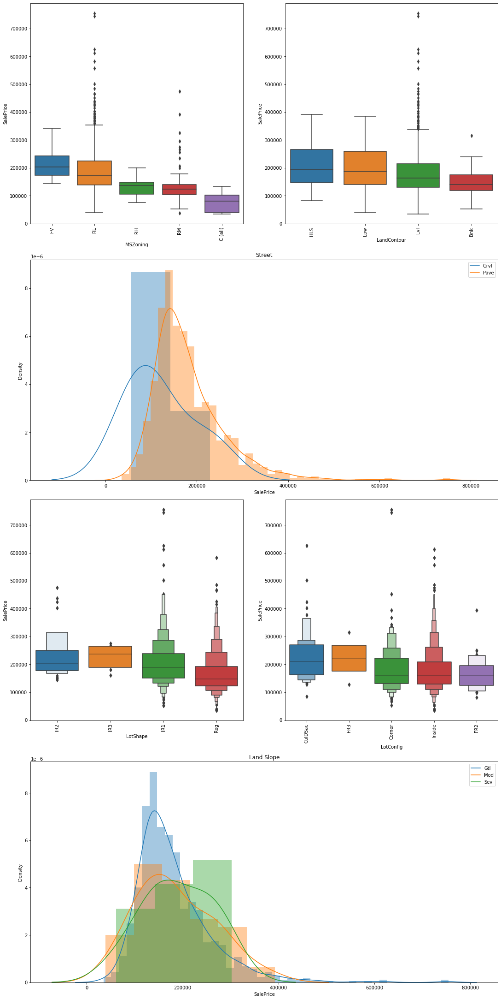

In [19]:
#Checking relation of Saleprice with object data columns using different plots

FIG=plt.figure(constrained_layout=True,figsize=(15,30))
GS=gridspec.GridSpec(4,2,figure=FIG)

plt.subplot(GS[0,0])
table=df1.groupby(['MSZoning'],as_index=False)['SalePrice'].mean().sort_values(by='SalePrice',ascending=False)
a1=sns.boxplot(data=df1,x='MSZoning',y='SalePrice',order=table['MSZoning'].to_list())
a1.set_xticklabels(a1.get_xticklabels(),rotation=90)

plt.subplot(GS[0,1])
table=df1.groupby(['LandContour'],as_index=False)['SalePrice'].mean().sort_values(by='SalePrice',ascending=False)
a1=sns.boxplot(data=df1,x='LandContour',y='SalePrice',order=table['LandContour'].to_list())
a1.set_xticklabels(a1.get_xticklabels(),rotation=90)

plt.subplot(GS[1,:])

a1=sns.distplot(df1[df1['Street']=='Grvl']['SalePrice'])
a1=sns.distplot(df1[df1['Street']=='Pave']['SalePrice'])
plt.legend('upper right',labels=['Grvl','Pave'])
plt.xlabel("SalePrice")
plt.title("Street")

plt.subplot(GS[2,0])
table=df1.groupby(['LotShape'],as_index=False)['SalePrice'].mean().sort_values(by='SalePrice',ascending=False)
a1=sns.boxenplot(data=df1,x='LotShape',y='SalePrice',order=table['LotShape'].to_list())
a1.set_xticklabels(a1.get_xticklabels(),rotation=90)

plt.subplot(GS[2,1])
table=df1.groupby(['LotConfig'],as_index=False)['SalePrice'].mean().sort_values(by='SalePrice',ascending=False)
a1=sns.boxenplot(data=df1,x='LotConfig',y='SalePrice',order=table['LotConfig'].to_list())
a1.set_xticklabels(a1.get_xticklabels(),rotation=90)

plt.subplot(GS[3,:])

a1=sns.distplot(df1[df1['LandSlope']=='Gtl']['SalePrice'])
a1=sns.distplot(df1[df1['LandSlope']=='Mod']['SalePrice'])
a1=sns.distplot(df1[df1['LandSlope']=='Sev']['SalePrice'])
plt.legend('upper right',labels=['Gtl','Mod','Sev'])
plt.xlabel("SalePrice")
plt.title("Land Slope")

Obseravtions:

1) From MSZoning vs Saleprice plot, we see that Floating Village Residential zone (FV) is having higher sale price of around 2 lakhs While Commercial Zones are having the lowest sale prices and we see a variation in sale prices in different zones which makes it an important feature for our prediction.

2) From LandCountour vs saleprice plot, we see that if the house has significant slope on both sides (HLS) or have depression (Low),sale prices is more. For nearly flat/level and banked slopes,Sale price is less.

3) From the 3rd plot, we see that For flat stones or bricks access streets,Price is higher and majority of houses with gravel street have price around 2 lakhs but as there is very less data for gravel street type this feature is not that important for prediction.

4) From LotShape vs saleprice plot, we can see that houses with regular Shapes have low price and as the irregularity increases, the average sale price of the house also increases.

5) From LotConfig vs saleprice plot,we see that the configuration of the lot does not appear to vary the prices. The property with Cul-de-sac and FR3(Frontage on 3 sides) configuration on average are having high value than the other configuration.

6) From the last plot, we see that most of the properties having gentle slope have less price while properties having moderate or severe slope have higher value.

Text(0.5, 1.0, 'Central air conditioning')

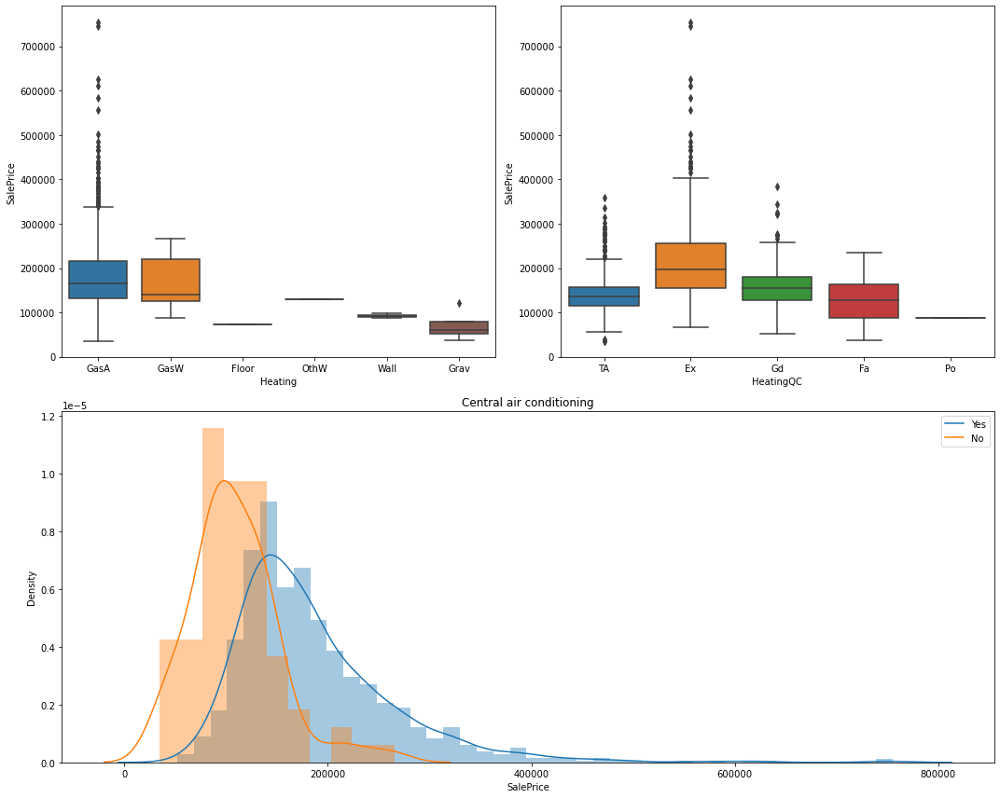

In [20]:
#Checking the variation of saleprice with object data columns using various plots

FIG=plt.figure(tight_layout=True,figsize=(15,12))
GS=gridspec.GridSpec(2,2)
plt.subplot(GS[0,0])
ax1=sns.boxplot(data=df1,x='Heating',y='SalePrice')

plt.subplot(GS[0,1])
ax1=sns.boxplot(data=df1,x='HeatingQC',y='SalePrice')

plt.subplot(GS[1,:])
sns.distplot(df1[df1['CentralAir']=='Y']['SalePrice'])
sns.distplot(df1[df1['CentralAir']=='N']['SalePrice'])
plt.legend('upper right',labels=['Yes','No'])
plt.xlabel("SalePrice")
plt.title("Central air conditioning")


Observations:

1) From plot-1, we can see that houses having GasW(Gas hot water or steam heat) and GasA(Gas forced warm air furnace) type of heating have high sale prices.

2) From plot-2, we see that houses with excellent(Ex) heating quality and condition costs more.

3) FRom plot-3, we see that houses having Central AC have higher price that the ones that don't have Central AC.

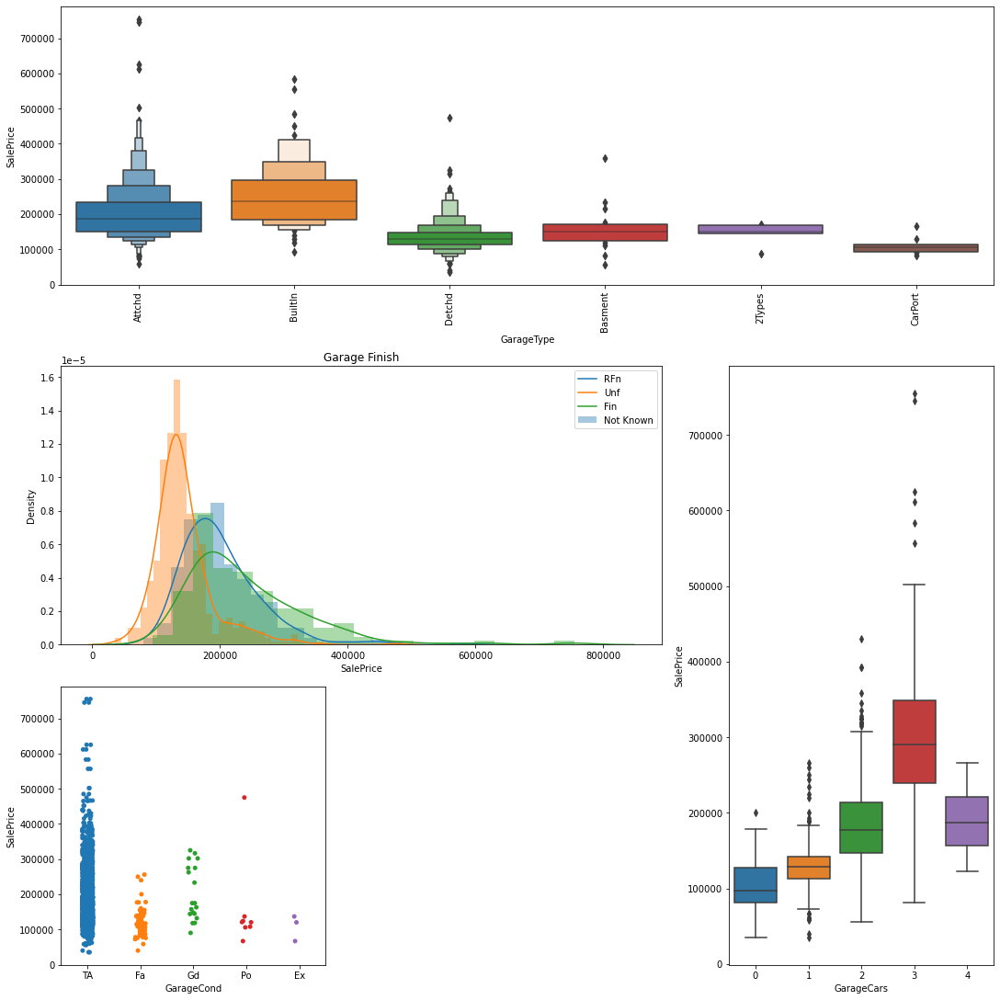

In [21]:
# Checking the variation of saleprice with different object columns using different plots
FIG=plt.figure(constrained_layout=True,figsize=(15,15))
GS=GridSpec(3,3,figure=FIG)

plt.subplot(GS[0,:])
a1=sns.boxenplot(data=df1,x='GarageType',y='SalePrice')
a1.set_xticklabels(a1.get_xticklabels(),rotation=90)

plt.subplot(GS[1,:-1])
sns.distplot(df1[df1['GarageFinish']=='RFn']['SalePrice'])
sns.distplot(df1[df1['GarageFinish']=='Unf']['SalePrice'])
sns.distplot(df1[df1['GarageFinish']=='Fin']['SalePrice'])
sns.distplot(df1[df1['GarageFinish']=='Not Known']['SalePrice'])

plt.legend('upper right',labels=['RFn','Unf','Fin','Not Known'])
plt.xlabel("SalePrice")
plt.title("Garage Finish")

plt.subplot(GS[1:,-1])
a1=sns.boxplot(data=df1,x="GarageCars",y="SalePrice")


plt.subplot(GS[-1,0])
a1=sns.stripplot(data=df1,x="GarageQual",y="SalePrice")


plt.subplot(GS[-1,0])
a1=sns.stripplot(data=df1,x="GarageCond",y="SalePrice")

Observations:

1) From plot-1. we can see that houses with built in or attached garages tend to have the highest prices, while those with more than one type of garage or a car port tend to have the lowest prices.

2) From plot-2, we see that roughly finished garages account for higher sale price than finished and unfinished ones, while the properties which don't have a garage have the lowest price.

3) From Garagecond vs saleprice plot, we see that houses with typical/average condition garages account for higher sale price than garages with excellent or poor condtion.

4) From GarageCars vs saleprice plot, we see that sale price is higher with high number of GarageCars which refers to size of garage in car capacity.

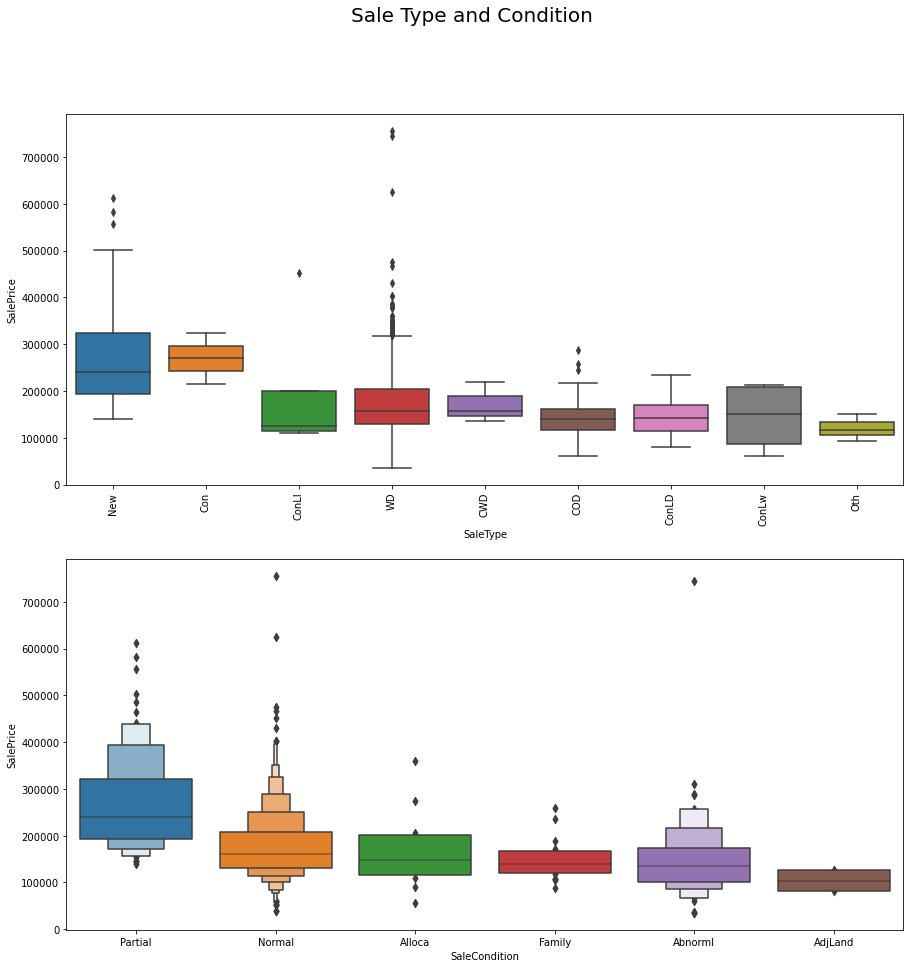

In [22]:
#Checking relation of saleprice with sale type and condition

FIG=plt.figure(figsize=(15,15))
plt.subplot(2,1,1)
table=df1.groupby(['SaleType'],as_index=False)['SalePrice'].mean().sort_values(by='SalePrice',ascending=False)
a1=sns.boxplot(data=df1,x='SaleType',y='SalePrice',order=table['SaleType'].to_list())
a1.set_xticklabels(a1.get_xticklabels(),rotation=90)

plt.subplot(2,1,2)
table=df1.groupby(['SaleCondition'],as_index=False)['SalePrice'].mean().sort_values(by='SalePrice',ascending=False)
a1=sns.boxenplot(data=df1,x='SaleCondition',y='SalePrice',order=table['SaleCondition'].to_list())

FIG.suptitle("Sale Type and Condition",fontsize=20)
plt.show()

Observation:

From saleType vs saleprice plot, we see that most of the properties are on warranty deed sale.

From saleCondition vs SalePrice plot, we see that if the house to be sold is in partial or normal condition,the price is higher than the rest of the conditions.

# Based on the analysis of the above categorical features,we can conclude that the following features are important in predicting the sale price.

1) MSSubclass and MSZoning

2) All the quality features such as the houses with average,good,excellent quality features will have higher sale price

3) Fireplaces and GarageCars as these number increases higher the sale price

4) We also seen variation in basement exposure.

5) SaleType and SaleConditon are the most important features.

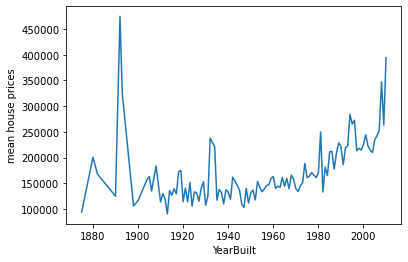

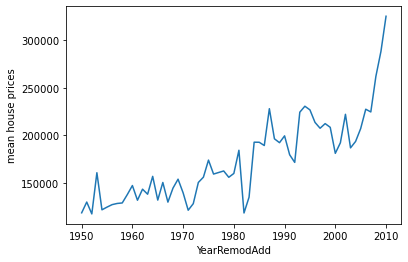

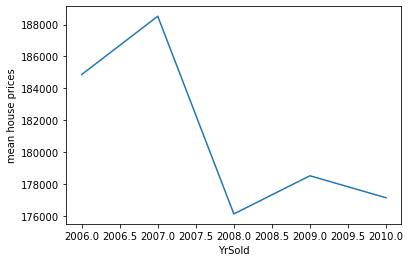

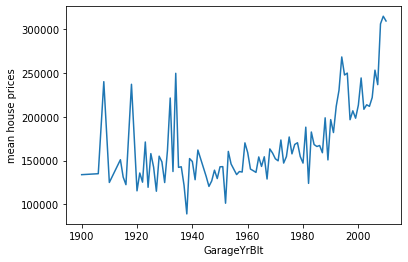

In [23]:
year_features=['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt']
for feature in year_features:
    ax=df1.groupby([feature])['SalePrice'].mean().plot()
    plt.ylabel("mean house prices")
    plt.show()

Observation: From the above plots, we can conclude that-

1) The houses and garage which were built between 1910-1950 have less sale price than the newer ones and after that with every year,house price increased

2) But if i notice Year Sold feature the price fell down with each year which is strange.

# Checking Outliers:

In [24]:
num_data=df1.select_dtypes(exclude='object')
X_col=num_data.columns.values

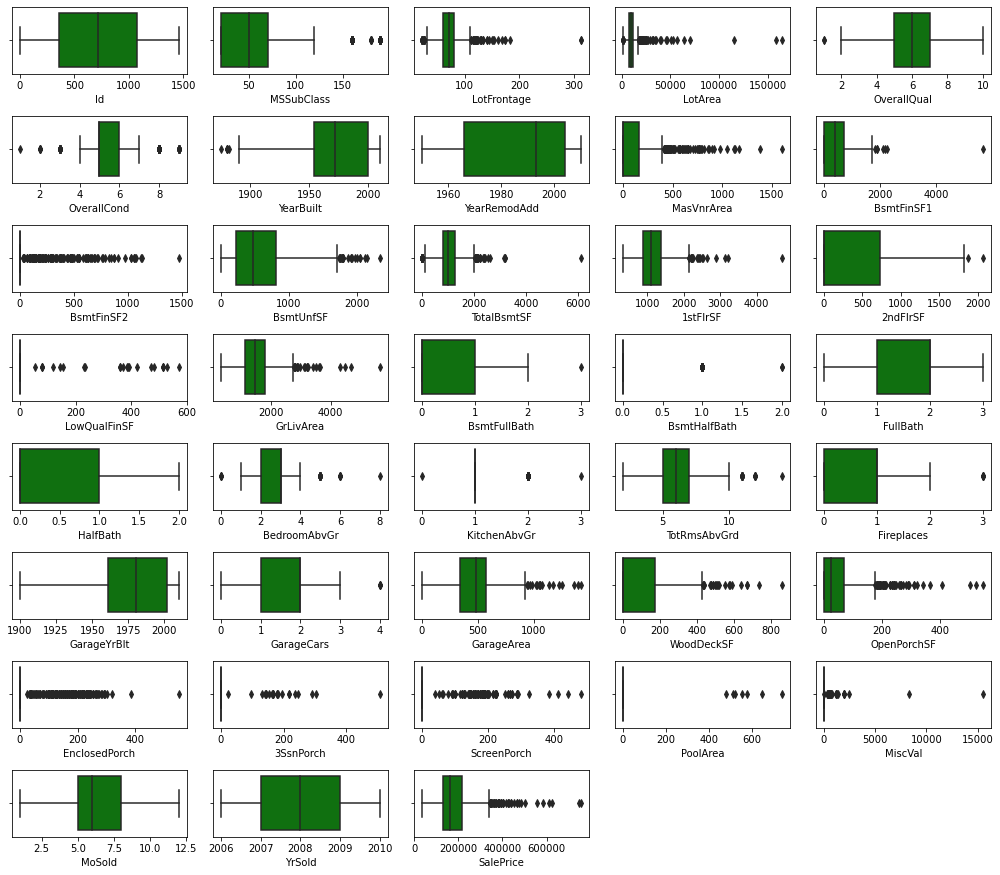

In [25]:
plt.figure(figsize=(14,30))
for i in range(0,len(X_col)):
    plt.subplot(20,5,i+1)
    ax=sns.boxplot(num_data[X_col[i]],color='green')
    plt.tight_layout()

Observation: We see that there are many outliers present so we have to remove them.

# Checking skewness:

In [26]:
df1.skew()

Id                0.026526
MSSubClass        1.422019
LotFrontage       2.450241
LotArea          10.659285
OverallQual       0.175082
OverallCond       0.580714
YearBuilt        -0.579204
YearRemodAdd     -0.495864
MasVnrArea        2.826173
BsmtFinSF1        1.871606
BsmtFinSF2        4.365829
BsmtUnfSF         0.909057
TotalBsmtSF       1.744591
1stFlrSF          1.513707
2ndFlrSF          0.823479
LowQualFinSF      8.666142
GrLivArea         1.449952
BsmtFullBath      0.627106
BsmtHalfBath      4.264403
FullBath          0.057809
HalfBath          0.656492
BedroomAbvGr      0.243855
KitchenAbvGr      4.365259
TotRmsAbvGrd      0.644657
Fireplaces        0.671966
GarageYrBlt      -0.644564
GarageCars       -0.358556
GarageArea        0.189665
WoodDeckSF        1.504929
OpenPorchSF       2.410840
EnclosedPorch     3.043610
3SsnPorch         9.770611
ScreenPorch       4.105741
PoolArea         13.243711
MiscVal          23.065943
MoSold            0.220979
YrSold            0.115765
S

# Treating Missing Values:

In [27]:
class Preprocess_Missingvalues:
    def __init__(self):
        pass

    def fit(self,X,y=None):
        return self

    def transform(self,X):
        X['LotFrontage']=X.groupby('Neighborhood')['LotFrontage'].transform(lambda x:x.fillna(x.mean()))
        X['Electrical']=X['Electrical'].fillna(X['Electrical'].mode()[0])
        for col in ['FireplaceQu','GarageType','GarageFinish','BsmtFinType2','PoolQC','Fence','MiscFeature','GarageQual','GarageCond','BsmtQual','BsmtCond','BsmtExposure',
                'BsmtFinType1','BsmtFinType2','MasVnrType','Alley']:
                X[col]=X[col].fillna('None')
        for col in ['GarageYrBlt','MasVnrArea']:
            X[col]=X[col].fillna(0)

        X=X.drop(['Utilities','Id'],axis=1)
        return X

Remarks: Here, we are defining a class to treat the missing value that are from categorical column or from numerical column and we are also droping some columns that are not useful like 'id' which only represent the unique ids.

# Feature Engineering:

In [28]:
class Feature_Engineering:
    def __init__(self):
        pass
    def fit(self,X,y=None):
        return self 
    def transform(self,X):
        X['SqFtPerRoom']=X['GrLivArea']/X['TotRmsAbvGrd']+(X['TotRmsAbvGrd']+
                                                        X['FullBath']+
                                                        X['HalfBath']+
                                                        X['KitchenAbvGr'])
        X['Total_Home_Quality']=X['OverallQual']+X['OverallCond']
        X['Total_Bathrooms']=(X['FullBath']+(0.5*X['HalfBath'])+
                           X['BsmtFullBath']+(0.5*X['BsmtHalfBath']))
        X['HighQualSF']=X['1stFlrSF']+X['2ndFlrSF']
        return X

Remarks: Here, we have defined a class to create more features so our machine learning models performs well. Feature engineering is one of the most important method in ML. As there are many bathrooms like some are fullbath while some are halfbath so we are creating a total bathroom feature and also creating the sqftperroom.

# Removing Outliers:

In [29]:
class remove_outliers:
    def __init__(self):
        pass
    def fit(self,X,y=None):
        return self
    def transform(self,X):
        for col in X.columns:
            percentile=X[col].quantile([0.01,0.98]).values
            X[col][X[col]<=percentile[0]]=percentile[0]
            X[col][X[col]>=percentile[1]]=percentile[1]
        return X

Remarks: As we have seen above that we have lot of outliers so we have to remove them hence i am using here percentile method to remove outliers. Somethimes what happen is that if we use zscore and IQR method,it deletes all the data, but with the help of percentile method we can replace the outliers with percentile value and we don't lose the data as well.

# Removing Skewness:

In [30]:
class skewness_remove:
    def __init__(self,skew=0.5):
        self.skew=skew
  
    def fit(self,X,y=None):
        return self

    def transform(self,X):
        x=X.copy()
        X_num=X.select_dtypes(exclude='object')
        skewness=X_num.apply(lambda x:x.skew())
        skewness_col=skewness[abs(skewness)>=self.skew].index
        X[skewness_col]=power_transform(X[skewness_col])
        X=pd.DataFrame(X,columns=x.columns)
        X = pd.get_dummies(X)
        return X

Remarks: To remove skewness we have created a class where if any column is having skewness more than -/+0.5, it will remove the skewness from that column.

# Feature Transformation:

In [31]:
class Encoding:
    def __init__(self):
        pass
    def fit(self,X,y=None):
        return self
    def transform(self,X):
        le=LabelEncoder()
        cols= ('MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
           'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
           'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
           'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
           'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
           'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
           'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
           'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
           'SaleType', 'SaleCondition')
        for c in cols:
            X[c]=le.fit_transform(X[c])
        return X

Remarks: Here, we are using LabelEncoder as we already have many columns and if we use onehot, it will increase the dimension of the data which will create problem for machine learning model to understand things.

# Feature Scaling:

In [32]:
class Feature_Scaling:
    def __init__(self):
        pass
    def fit(self,X,y=None):
        return self
    def transform(self,X):
        x=X.copy()
        scale=StandardScaler()
        X=scale.fit_transform(X)
        X=pd.DataFrame(X,columns=x.columns)
        return X

Remarks: Here, we are using StandardScaler to scale all high values to same scale.

# Pipeline For Machine Learning:

In [33]:
from sklearn.pipeline import Pipeline
pipe=Pipeline([
               ("Preprocess_Missingvalues",Preprocess_Missingvalues()),       #Removing and treating missing values
               ("Feature_Engineering",Feature_Engineering()),                 #Adding more columns
               ("Encoding",Encoding()),                                       #Feature transformation converting all the categorical columns into numeric columns 
               ("remove_outliers",remove_outliers()),                         #removing outliers
               ("skewness_remove",skewness_remove()),                        #removing skewness
               ("Feature_Scaling",Feature_Scaling())                         #scaling all the values
])

# Splitting the data into dependent(x) and independent(y) variables

In [34]:
X=df1.drop(['SalePrice'],axis=1)
y=df1['SalePrice']
print(X.shape)
print(y.shape)

(1168, 80)
(1168,)


In [35]:
from sklearn.preprocessing import OrdinalEncoder,power_transform,StandardScaler,MinMaxScaler,LabelEncoder
X_new=pipe.fit_transform(X)

In [36]:
X_new.head(8)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SqFtPerRoom,Total_Home_Quality,Total_Bathrooms,HighQualSF
0,1.370435,-0.162061,-1.926557,-1.306083,0.0,0.016675,-1.366794,0.341434,0.617281,-0.238775,0.143856,0.049544,0.0,2.310950,-0.549930,-0.072810,-0.501011,0.030839,-0.421463,-0.434107,0.0,-0.329231,-0.209982,0.395209,-0.813049,0.778521,0.377961,-0.564741,-0.570258,0.349221,0.585209,-1.404371,-0.117054,0.404371,-0.363019,0.916764,0.067300,-0.144841,1.390230,0.267506,0.302595,-0.481887,-0.871789,0.0,-1.281768,-0.838227,-0.238775,0.799167,-0.783109,-1.144966,-0.218022,0.944965,-1.009429,0.276577,0.779453,1.626744,-0.813801,0.231659,-0.014371,0.307737,-0.163806,0.335218,0.317553,0.300947,-0.960144,1.423871,-0.411301,0.0,-0.297551,0.0,0.0,0.503226,-0.193133,-0.193133,-1.617822,-0.605487,0.409069,0.029735,-0.954641,-0.434079,-0.261653,-1.262452
1,-1.167999,-0.162061,1.250916,1.356458,0.0,0.016675,-1.366794,0.341434,0.617281,4.188040,-0.023000,0.049544,0.0,-0.436548,-0.549930,1.419154,0.458609,-0.182739,-0.710324,-3.860200,0.0,1.182134,1.119374,0.395209,-0.813049,-1.124906,-2.646145,0.884968,1.002496,-2.877335,-1.330630,-1.404371,0.395541,-1.935452,2.755953,1.042594,2.453434,-0.144841,-0.897602,0.267506,0.302595,2.082190,-0.871789,0.0,1.377184,1.192995,-0.238775,0.799167,-0.783109,1.475072,-0.218022,-0.687929,0.975397,0.276577,0.779453,1.626744,-0.813801,0.195320,0.990955,0.307737,0.717359,0.335218,0.317553,0.300947,0.783831,1.428474,-0.411301,0.0,3.360785,0.0,0.0,0.503226,-0.193133,-0.193133,1.361470,-0.605487,0.409069,0.029735,1.135629,1.434487,1.061336,1.383284
2,0.490047,-0.162061,1.095496,0.113089,0.0,0.016675,-1.366794,0.341434,-1.482445,-0.238775,0.477567,0.049544,0.0,-0.436548,1.030838,0.673172,-0.501011,0.840217,0.589553,-0.434107,0.0,-0.652181,-0.781046,0.395209,-0.813049,-1.124906,0.377961,0.884968,-0.570258,0.349221,-1.737474,-0.516039,0.934402,0.404371,-0.363019,-0.510359,0.165553,-0.144841,-0.897602,0.267506,0.302595,0.048689,1.177246,0.0,1.060650,1.192995,-0.238775,0.799167,1.276961,0.165053,-0.218022,0.944965,0.975397,0.276577,0.779453,1.626744,-0.813801,0.336453,0.990955,0.307737,-0.090782,0.335218,0.317553,0.300947,1.047285,1.208580,-0.411301,0.0,-0.297551,0.0,0.0,0.503226,-0.193133,-0.193133,-0.128176,-0.605487,0.409069,0.029735,0.557130,0.188776,1.722831,1.067513
3,-1.167999,-0.162061,1.768982,0.530989,0.0,0.016675,-1.366794,0.341434,0.617281,-0.238775,0.310711,0.049544,0.0,-0.436548,-0.549930,-0.072810,0.458609,0.067671,-0.373319,1.849289,0.0,-0.329231,-0.209982,-1.241686,1.392506,0.778521,0.377961,-0.564741,-0.570258,0.349221,0.585209,-0.960205,0.803940,0.404371,-0.363019,1.178365,1.997087,-0.144841,-0.897602,0.267506,0.302595,1.665038,-0.871789,0.0,0.775546,-0.838227,-0.238775,0.799167,-0.783109,0.165053,-0.218022,0.944965,0.313788,0.276577,0.779453,1.626744,-0.813801,0.231659,-0.014371,0.307737,0.352235,0.335218,0.317553,0.300947,-0.960144,1.178672,-0.411301,0.0,-0.297551,0.0,0.0,-1.935972,-0.193133,-0.193133,-1.990233,1.651563,-2.769993,0.029735,0.788614,0.188776,-0.261653,0.783280
4,-1.167999,-0.162061,0.550087,1.497522,0.0,0.016675,-1.366794,0.341434,-1.025661,-0.238775,0.310711,0.049544,0.0,-0.436548,-0.549930,-0.072810,1.288527,0.067

# Multivariate Analysis:

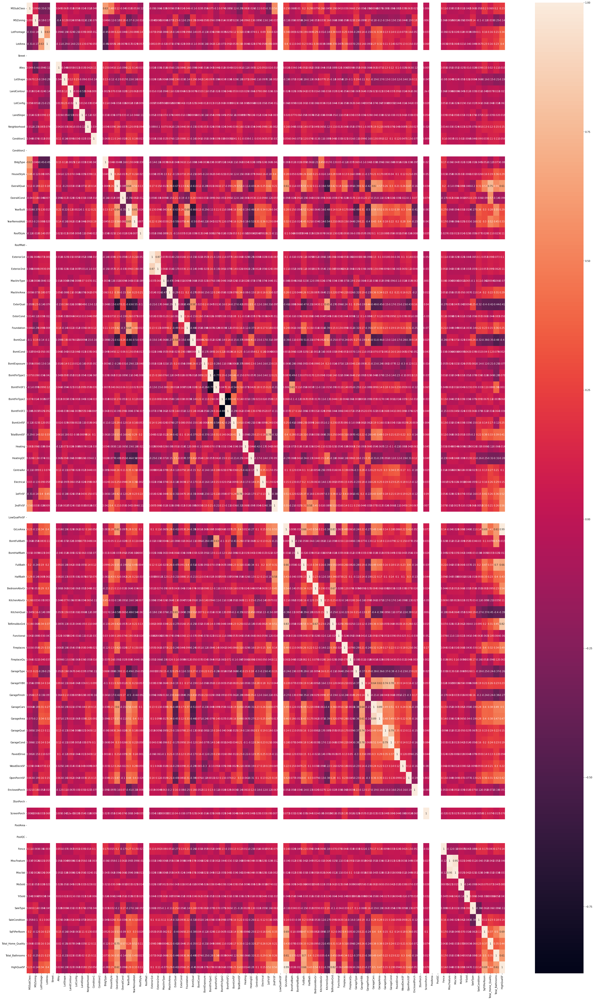

In [37]:
#Checking Correlation using heatmap

X_corr=X_new.corr()
plt.figure(figsize=(45,75))
sns.heatmap(X_corr,annot=True)
plt.show()

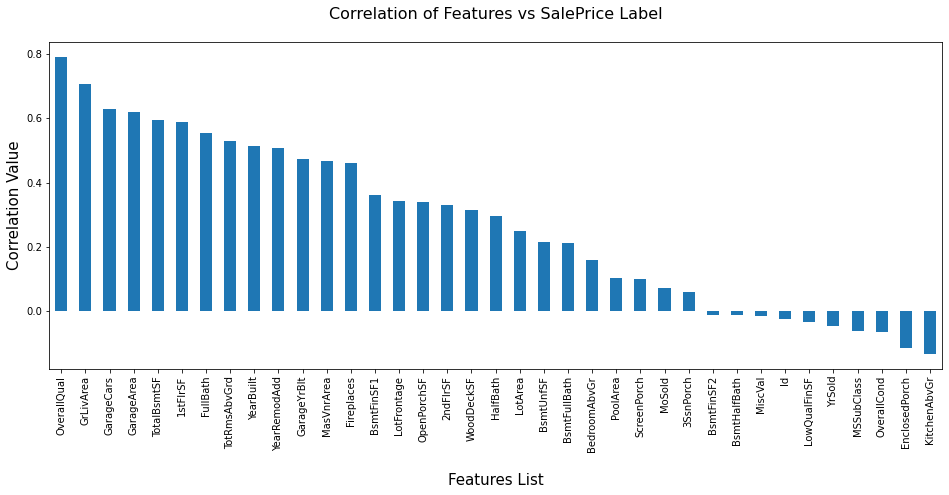

In [38]:
#checking correlation with the help of barplot
df1_corr = df1.corr()
plt.figure(figsize=(16,6))
df1_corr['SalePrice'].sort_values(ascending=False).drop('SalePrice').plot.bar()
plt.title("Correlation of Features vs SalePrice Label\n", fontsize=16)
plt.xlabel("\nFeatures List", fontsize=15)
plt.ylabel("Correlation Value", fontsize=15)
plt.show()

In [39]:
#Defining a function to check multicollinearity

def correlation(dataset,threshold):
    col_corr=set()
    corr_matrix=dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j]) > threshold:
                colname=corr_matrix.columns[i]
                print(corr_matrix.iloc[i,j],corr_matrix.columns[i],corr_matrix.columns[j])
                col_corr.add(colname)
                return col_corr

In [40]:
corr_features=correlation(X_new,0.90)

0.9506047534330134 MiscVal MiscFeature


In [41]:
X_new=X_new.drop(['MiscVal','HighQualSF'],axis=1)

Remarks: There are total four columns that are highly correlated to each other so we have dropped two of them.

# Target Column Transformation:

<AxesSubplot:title={'center':'Log Transform Distribution'}, xlabel='SalePrice', ylabel='Density'>

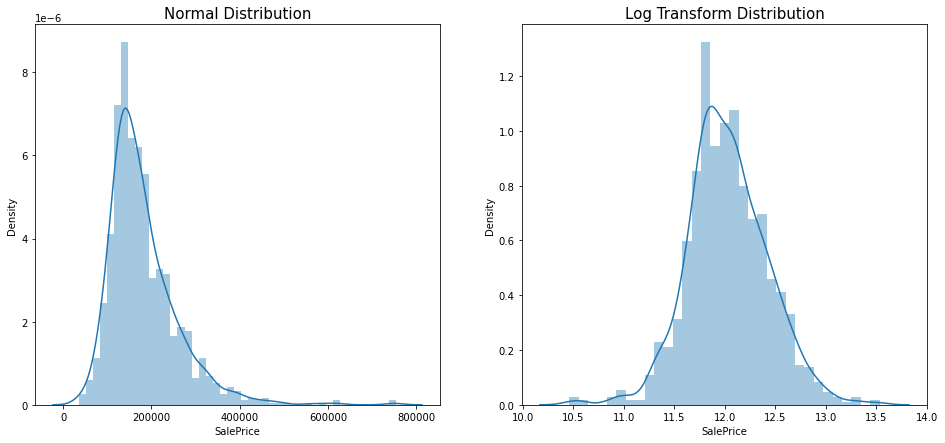

In [42]:
plt.figure(figsize=(16,7))
plt.subplot(1,2,1)
plt.title("Normal Distribution",fontsize=15)
sns.distplot(y)
plt.subplot(1,2,2)
plt.title("Log Transform Distribution",fontsize=15)
sns.distplot(np.log(y))

Observation: From the above plot, we can see that the target column is right skewed and we can transform our target column and at the time of prediction we will inverse it so there will be no effect of it on our prediction.

# Splitting data for model building using train test split:

In [43]:
X_train,X_test,y_train,y_test=train_test_split(X_new,np.log(y),test_size=0.3,random_state=42)

# Training Multiple Models:

In [44]:
from sklearn.ensemble import ExtraTreesRegressor,RandomForestRegressor
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV,KFold
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
! pip install scikit-plot
import scikitplot as skplt

In [45]:
models={
    "ExtraTreesRegressor":ExtraTreesRegressor(),
    "RandomForestRegressor":RandomForestRegressor(),
    "LinearRegression":LinearRegression(),
    "DecisionTreeRegressor":DecisionTreeRegressor(),
    "Lasso":Lasso(),
    
}

# Finding the best model:

************************************************ ExtraTreesRegressor *****************************************************
MEAN SQUARED ERROR 0.02321661210588569


MEAN ABSOLUTE ERROR 0.1025070453168522


CVS_SCORE 0.8691733758030582


R2_SCORE 0.8584395469403403


RMSE 0.15236998426818088


MODEL PERFORMANCE CURVE


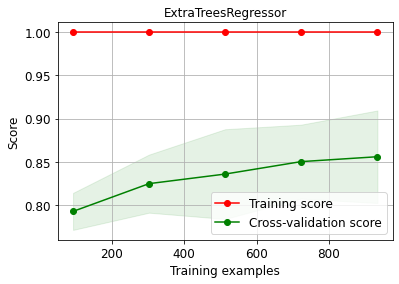

************************************************ RandomForestRegressor *****************************************************
MEAN SQUARED ERROR 0.02665752839994985


MEAN ABSOLUTE ERROR 0.11044341172319423


CVS_SCORE 0.8650981297763771


R2_SCORE 0.8374589806412375


RMSE 0.16327133367480604


MODEL PERFORMANCE CURVE


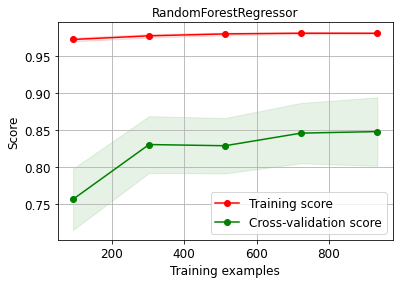

************************************************ LinearRegression *****************************************************
MEAN SQUARED ERROR 0.02143986507465594


MEAN ABSOLUTE ERROR 0.09457288792637165


CVS_SCORE 0.8734769145598804


R2_SCORE 0.8692730446774855


RMSE 0.14642358100612052


MODEL PERFORMANCE CURVE


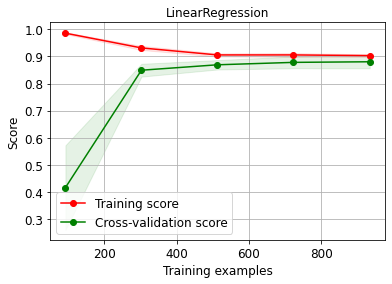

************************************************ DecisionTreeRegressor *****************************************************
MEAN SQUARED ERROR 0.05189326651231199


MEAN ABSOLUTE ERROR 0.16021297706824278


CVS_SCORE 0.7197845586209201


R2_SCORE 0.683587153684398


RMSE 0.22780093615328273


MODEL PERFORMANCE CURVE


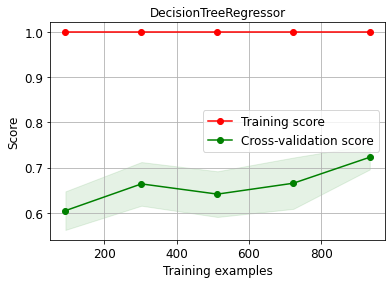

************************************************ Lasso *****************************************************
MEAN SQUARED ERROR 0.16422438702087788


MEAN ABSOLUTE ERROR 0.31972702403325554


CVS_SCORE -0.011090550813591716


R2_SCORE -0.0013381161770285033


RMSE 0.4052460820549384


MODEL PERFORMANCE CURVE


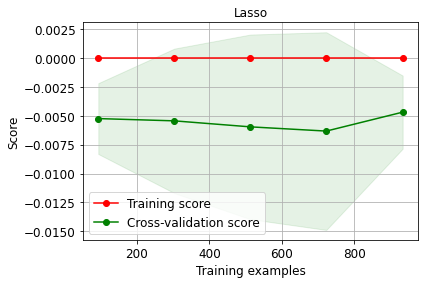

In [46]:
CVS=[]
R2=[]
MSE=[]
MAE=[]
RMSE=[]
NAME=[]
kf=KFold(n_splits=5,shuffle=True)
for name, model in models.items():
    print("************************************************",name,"*****************************************************")
    NAME.append(name)
    model.fit(X_train,y_train)
    y_pred=model.predict(X_test)
    mse=mean_squared_error(y_test,y_pred)
    MSE.append(mse)
    print("MEAN SQUARED ERROR",mse)
    mae=mean_absolute_error(y_test,y_pred)
    MAE.append(mae)
    print('\n')
    print("MEAN ABSOLUTE ERROR",mae)
    cvs=cross_val_score(model,X_new,np.log(y),scoring='r2',cv=kf).mean()
    CVS.append(cvs)
    print('\n')
    print("CVS_SCORE",cvs)
    r2=r2_score(y_test,y_pred)
    R2.append(r2)
    print('\n')
    print("R2_SCORE",r2)
    rmse=np.sqrt(mse)
    RMSE.append(rmse)
    print('\n')
    print("RMSE",rmse)
    print('\n')
    print('MODEL PERFORMANCE CURVE')
    skplt.estimators.plot_learning_curve(model,X_new,np.log(y),cv=kf,scoring='r2',title=name,text_fontsize='large')
    plt.show()

In [47]:
models_result=pd.DataFrame({
    "NAME":NAME,
    "Cross_Val_Score":CVS,
    "R2_score":R2,
    "Mean_squared_error":MSE,
    "Mean_Absolute_Error":MAE,
    "RMSE":RMSE
})

In [48]:
models_result

,NAME,Cross_Val_Score,R2_score,Mean_squared_error,Mean_Absolute_Error,RMSE
0,ExtraTreesRegressor,0.869173,0.858440,0.023217,0.102507,0.152370
1,RandomForestRegressor,0.865098,0.837459,0.026658,0.110443,0.163271
2,LinearRegression,0.873477,0.869273,0.021440,0.094573,0.146424
3,DecisionTreeRegressor,0.719785,0.683587,0.051893,0.160213,0.227801
4,Lasso,-0.011091,-0.001338,0.164224,0.319727,0.405246


Remarks: LinearRegression model is showing a good result .

# Hyperparameter tuning our best ML model

In [49]:

from sklearn.model_selection import GridSearchCV

In [50]:
lr = LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

lr.fit(X_train, y_train)
lr_confidence = lr.score(X_test, y_test)
print("lr confidence: ", lr_confidence)


lr confidence:  0.8692730446774855


Remarks: After successfully incorporating the HyperParameter Tuning on the final Model, we have not received increase in accuracy 

In [51]:
lr.fit(X_train,y_train)
Y_Pred=lr.predict(X_test)

# Final Model Metrics:

In [52]:
print("Mean Squared Error",mean_squared_error(y_test,Y_Pred))
print("Mean Absolute Error",mean_absolute_error(y_test,Y_Pred))
print("RMSE",np.sqrt(mean_squared_error(y_test,Y_Pred)))
print("R2 Score",r2_score(y_test,Y_Pred))

Mean Squared Error 0.02143986507465594
Mean Absolute Error 0.09457288792637165
RMSE 0.14642358100612052
R2 Score 0.8692730446774855


# Saving the model:

In [53]:
import joblib
joblib.dump(lr,"House_Price_Prediction_Model.obj")

['House_Price_Prediction_Model.obj']

# Loading the model:

In [54]:
Model=joblib.load('House_Price_Prediction_Model.obj')

In [55]:
Model.predict(X_test)

array([12.16653639, 11.8315395 , 11.37361443, 12.06021606, 11.50117338,
       12.70702275, 11.95773146, 11.88401749, 11.76121423, 12.27248826,
       11.79679531, 12.38992144, 12.20680672, 12.39512053, 12.00687796,
       12.72577718, 11.64318069, 12.45584812, 11.77264219, 11.75921921,
       12.00629807, 12.68571772, 12.20083782, 11.85753906, 12.19718262,
       11.79664053, 11.77441362, 11.98565075, 12.44491725, 12.10736216,
       12.18671429, 12.0632507 , 11.71880319, 11.78068943, 11.8580582 ,
       12.33710693, 12.1065613 , 11.59379299, 11.62372718, 12.1846296 ,
       11.37806419, 11.91240535, 12.18809761, 12.86186613, 11.28952949,
       11.33915258, 11.89029458, 11.73146412, 12.22856245, 12.50210115,
       11.77208849, 11.37182923, 11.8405536 , 11.93155967, 11.34717339,
       12.71564153, 11.72386962, 11.72131776, 11.89189032, 12.38105356,
       12.53152685, 11.94555233, 11.77091365, 11.54122096, 12.01635073,
       11.89759187, 12.14769527, 12.5845804 , 11.67200762, 11.46

# Loading the Training dataset:

In [56]:
df_test=pd.read_csv('test.csv')

In [57]:
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [58]:
df_test.shape

(292, 80)

# Passing testing data through pipeline:

In [59]:
Test_Data=pipe.fit_transform(df_test)

In [60]:
Test_Data=Test_Data.drop(['MiscVal','HighQualSF'],axis=1)

Remarks: Dropping these two columns as these were highly correlated.

# Prediction:

In [61]:
Test_Data=Model.predict(Test_Data)

In [62]:
Final_Test_Price=pd.DataFrame(Test_Data,columns=['SalePrice'])

In [63]:
FINAL_TEST_DATA=pd.read_csv('test.csv')

In [64]:
FINAL_TEST_DATA['SalePrice']=np.exp(Final_Test_Price)  

In [65]:
FINAL_TEST_DATA

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal,345087.971331
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml,208998.288409
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,251810.610828
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,161664.657808
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal,232028.944484
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal,84401.394031
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal,139799.628929
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial,336296.972458
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal,266765.208405
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,32

In [66]:
FINAL_TEST_DATA.shape

(292, 81)

CONCLUSION:

1) In this dataset, we were asked to predict the housing prices.

2) We analyzed the dataset firstly and then we performed EDA to understand the effect of features on our target attribute.

3) We have performed all the steps of data science life cycle in this project i.e., data pre-processing, data cleaning, Feature Engineering, Feature selection, Feature Transformation and then Model Building.

4) We performed model buildling using many models and we found that LinearRegression was giving good accuracy score so we selected this model and performed hyperparameter tuning to increase the accuracy. At the end, we have build a model that was able to predict the saleprice of the houses with 86 % accuracy.

5) We saved the model using joblib for future prediction.

6) Then we used the test dataset and passed it through the pre-processing pipeline.

7) Finally, We loaded the saved model that we obtained analyzing the test dataset and did the predictions over the test data.